<a href="https://colab.research.google.com/github/ideepankarsharma2003/Colab-Tutorials/blob/CNN/FaceRecognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Face Recognition**

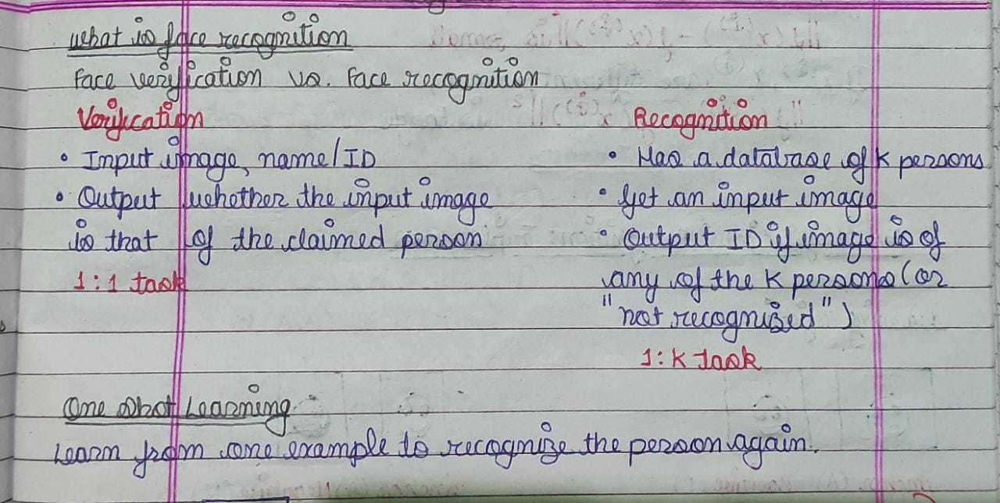

### Importing Packages

In [1]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, ZeroPadding2D, Activation, Input, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import MaxPooling2D, AveragePooling2D
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.layers import Lambda, Flatten, Dense
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K
K.set_image_data_format('channels_last')
import os
import numpy as np
from numpy import genfromtxt
import pandas as pd
import tensorflow as tf
import PIL

%matplotlib inline
%load_ext autoreload
%autoreload 2

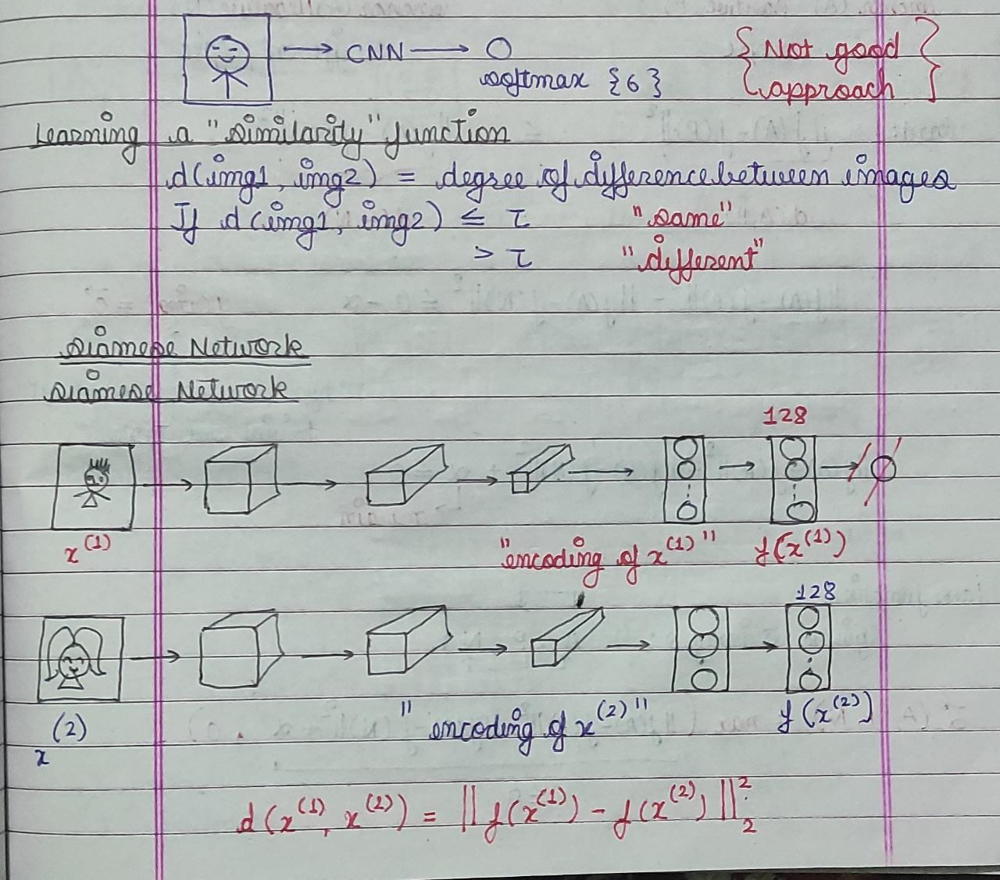

## **Encoder**
Image -----> 128 dimensional vector

[link text](https://arxiv.org/abs/1409.4842)

### ConvNet To compute Encodings


- This network uses 160x160 dimensional RGB images as its input. Specifically, a face image (or batch of $m$ face images) as a tensor of shape $(m, n_H, n_W, n_C) = (m, 160, 160, 3)$
- The input images are originally of shape 96x96, thus, you need to scale them to 160x160. This is done in the `img_to_encoding()` function.
- The output is a matrix of shape $(m, 128)$ that encodes each input face image into a 128-dimensional vector


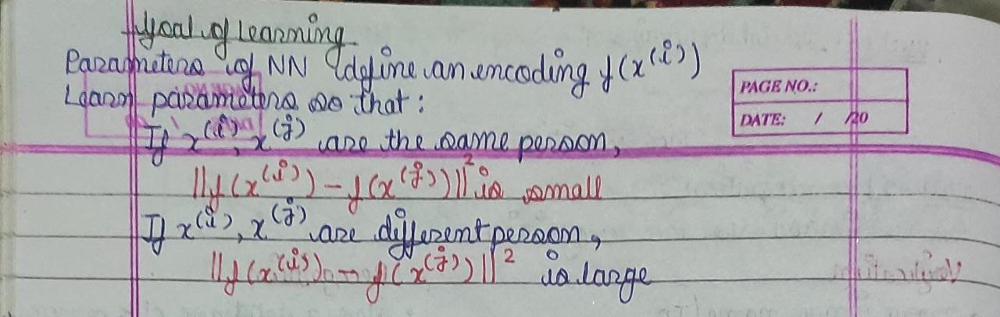

In [2]:
from tensorflow.keras.models import model_from_json

json_file = open('/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights('/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/model.h5')

In [3]:
print(model.inputs)
print(model.outputs)

[<KerasTensor: shape=(None, 160, 160, 3) dtype=float32 (created by layer 'input_1')>]
[<KerasTensor: shape=(None, 128) dtype=float32 (created by layer 'Bottleneck_BatchNorm')>]


## **Triplet Loss**

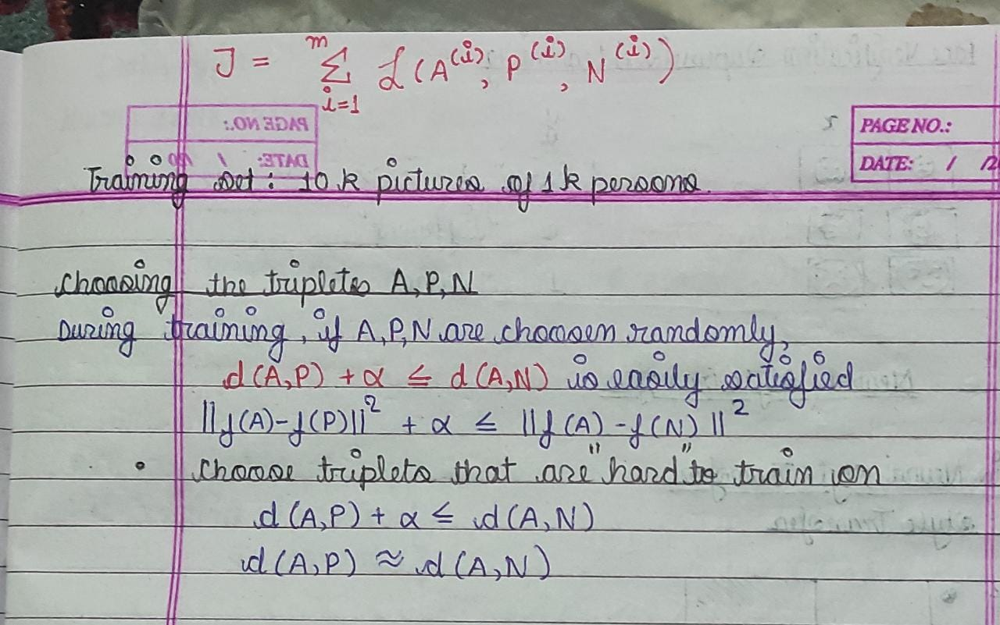

In [4]:
def triplet_loss(y_true, y_pred, alpha = 0.2):
    anchor, positive, negative = y_pred[0], y_pred[1], y_pred[2]
    pos_dist = tf.subtract(anchor, positive)
    pos_dist= tf.square(pos_dist)
    pos_dist= tf.reduce_sum(pos_dist, axis=-1)
    neg_dist = tf.subtract(anchor, negative)
    neg_dist= tf.square(neg_dist)
    neg_dist= tf.reduce_sum(neg_dist, axis=-1)
    basic_loss = pos_dist-neg_dist + alpha
    basic_loss= tf.maximum(basic_loss, 0)
    loss = tf.reduce_sum(basic_loss)
    return loss

### Loading The Pre-Trained Model 

In [5]:
FRmodel = model

## **Face Verification**

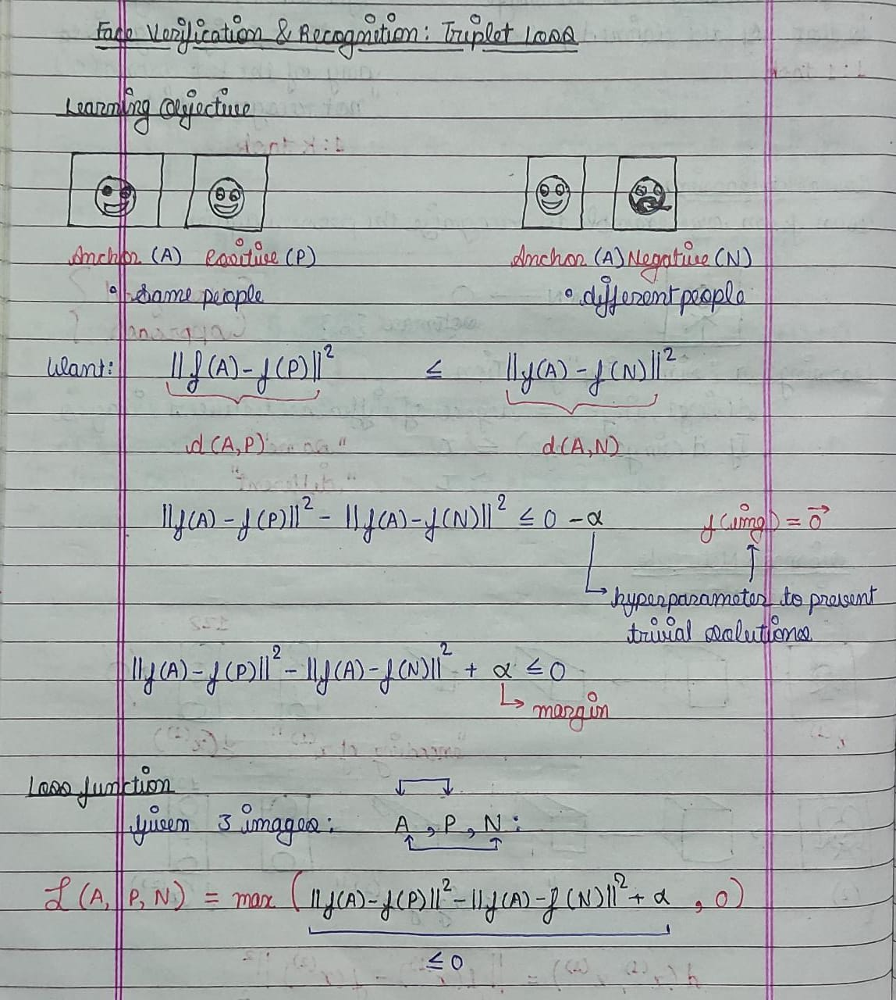

In [6]:
#  generate the encoding ----> 128 dimensional vector
def img_to_encoding(image_path, model):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(160, 160))
    img = np.around(np.array(img) / 255.0, decimals=12)
    x_train = np.expand_dims(img, axis=0)
    embedding = model.predict_on_batch(x_train)
    return embedding / np.linalg.norm(embedding, ord=2)

In [7]:
# database (represented as a Python dictionary). 
# mapping { person's name -----> 128-dimensional encoding of their face }
database = {}
database["deepankar"] = img_to_encoding("/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/deepankar.jpg", FRmodel)
database["dean"] = img_to_encoding("/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/dean05.jpg", FRmodel)
database["kannu"] = img_to_encoding("/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/kannu.jpg", FRmodel)

Load Images

In [8]:
deepankar = tf.keras.preprocessing.image.load_img("/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/deepankar.jpg", target_size=(160, 160))
dean = tf.keras.preprocessing.image.load_img("/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/dean05.jpg", target_size=(160, 160))
kannu = tf.keras.preprocessing.image.load_img("/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/kannu.jpg", target_size=(160, 160))

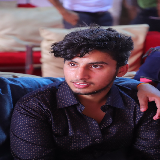

In [9]:
deepankar

(160, 160, 3)


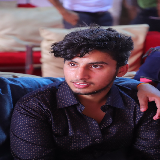

In [10]:
print(np.around(np.array(deepankar) / 255.0, decimals=12).shape)
deepankar

(160, 160, 3)


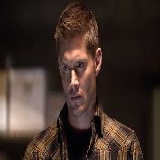

In [11]:
print(np.around(np.array(dean) / 255.0, decimals=12).shape)
dean

(160, 160, 3)


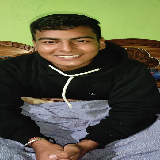

In [12]:
print(np.around(np.array(kannu) / 255.0, decimals=12).shape)
kannu

## **Verify**

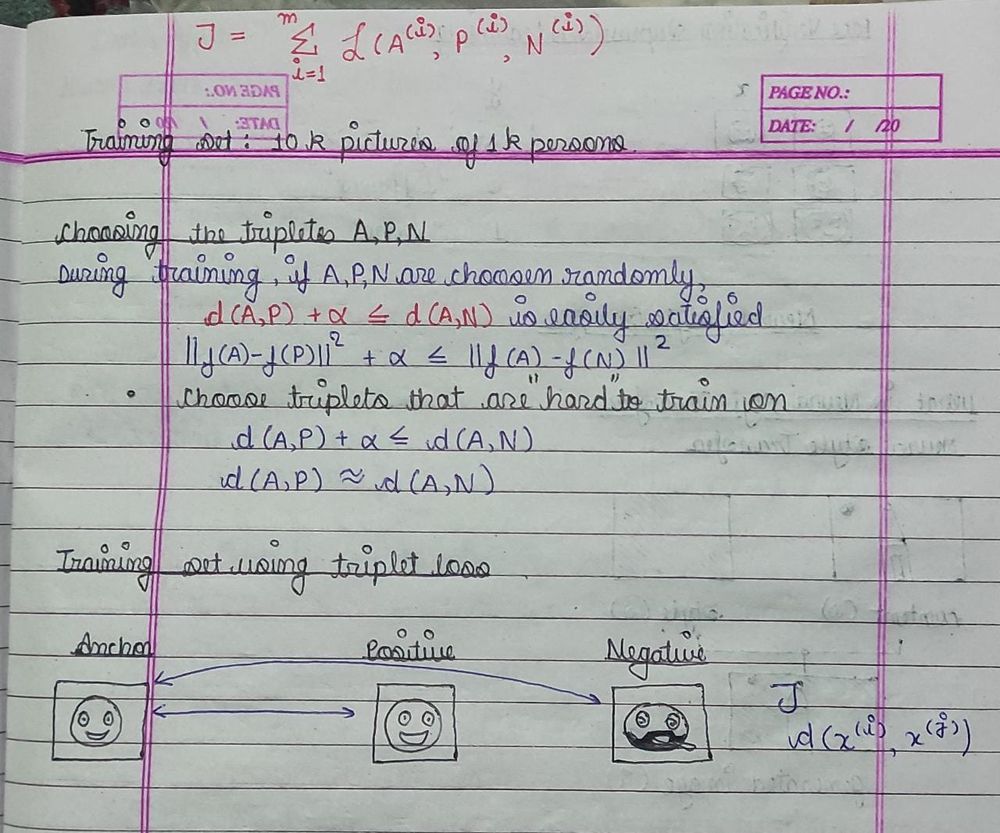

In [13]:

def verify(image_path, identity, database, model):
    encoding = img_to_encoding(image_path, model)
    dist= np.linalg.norm(encoding-database[identity])
    if dist < 0.7:
        print("It's " + str(identity) + ", welcome in!")
        door_open = True
    else:
        print("It's not " + str(identity) + ", please go away")
        door_open = False
    return dist, door_open

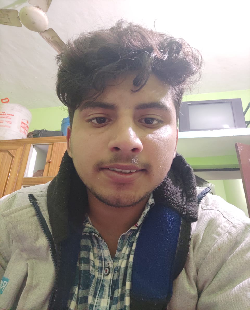

In [14]:
path="/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/lucky01.jpg"
img= tf.keras.preprocessing.image.load_img(path, target_size=(310, 250))
img

It's deepankar, welcome in!


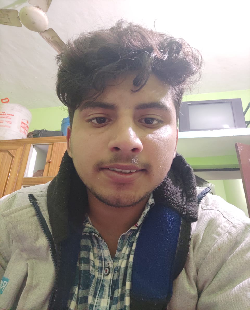

In [15]:
verify(path, "deepankar", database, FRmodel)
img

It's not dean, please go away


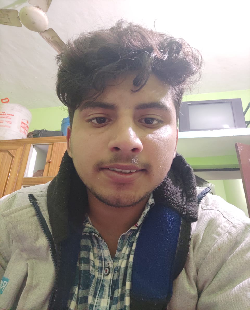

In [16]:
verify(path, "dean", database, FRmodel)
img

It's dean, welcome in!


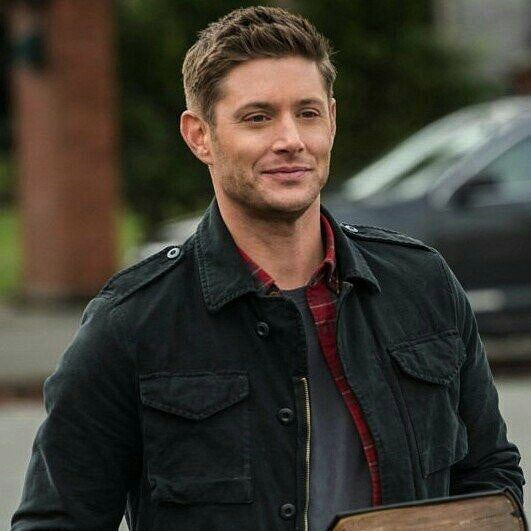

In [17]:
path="/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/dean04.jpg"
img= tf.keras.preprocessing.image.load_img(path)
verify(path, "dean", database, FRmodel)
img

## **Face Recognition**

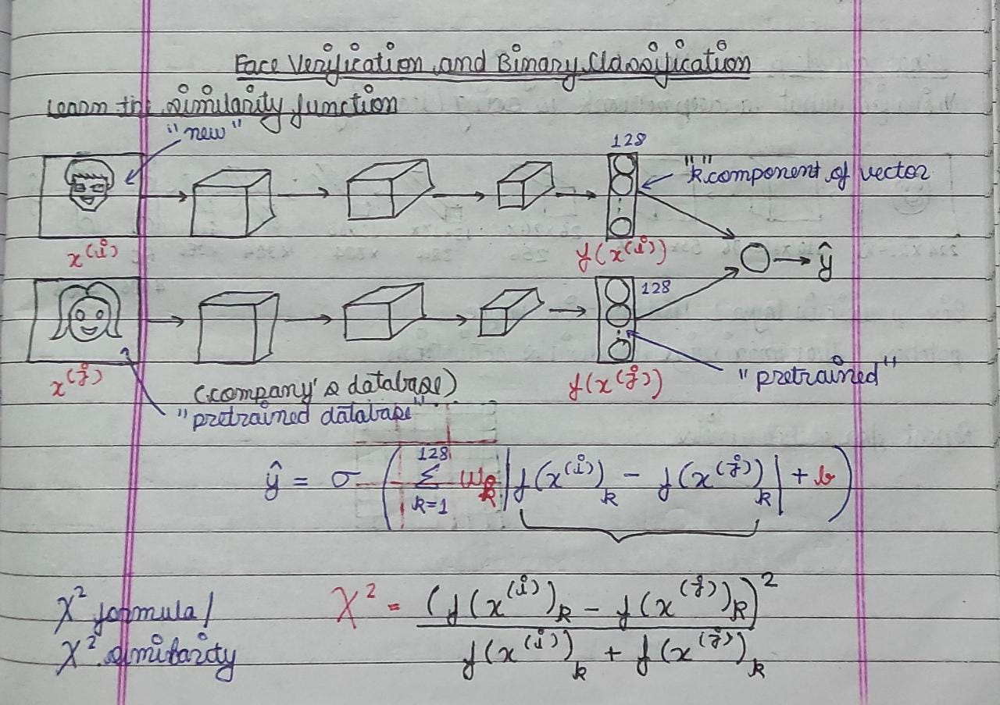

In [18]:
def who_is_it(image_path, database, model):
    encoding =  img_to_encoding(image_path, model)
    min_dist = 100
    for (name, db_enc) in database.items():
        dist = np.linalg.norm(db_enc- encoding)
        if dist < min_dist:
            min_dist = dist
            identity = name
    if min_dist > 0.7:
        print("Not in the database.")
    else:
        print ("it's " + str(identity) + ", the distance is " + str(min_dist))
    return min_dist, identity

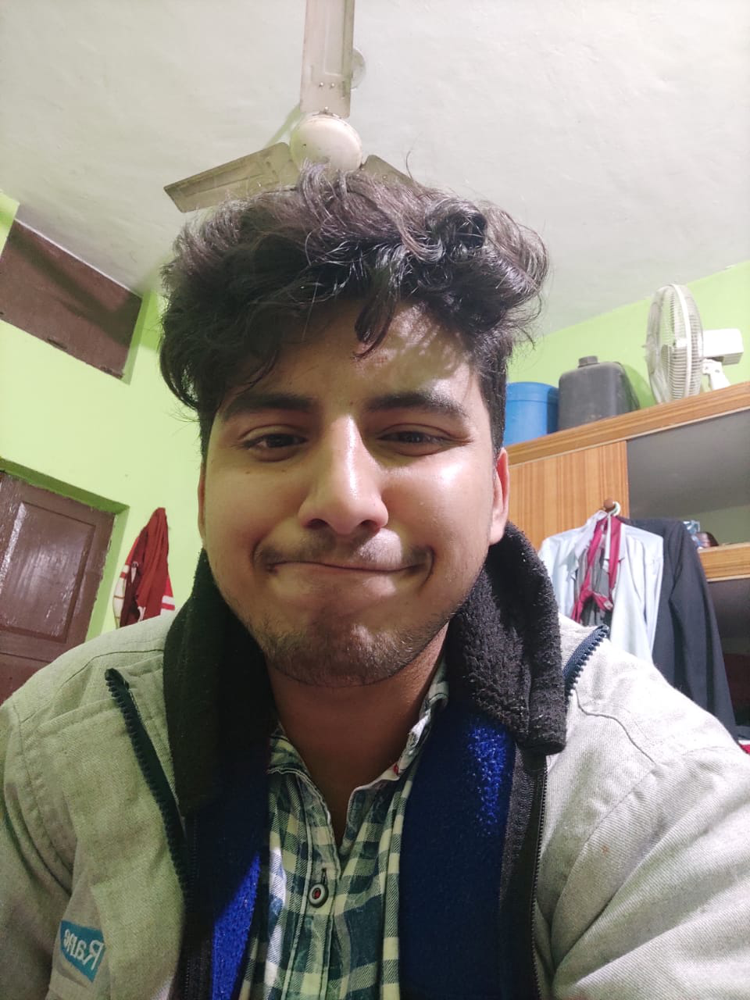

In [19]:
path="/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/lucky.jpg"
img= tf.keras.preprocessing.image.load_img(path)
img

In [20]:
who_is_it(path, database, FRmodel)

it's deepankar, the distance is 0.5105308


(0.5105308, 'deepankar')

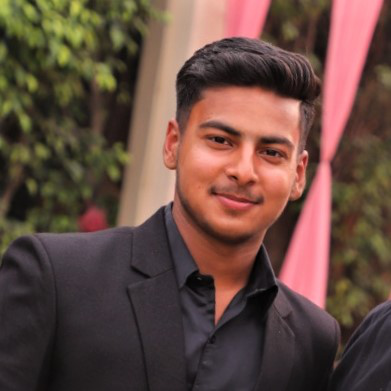

In [21]:
path="/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/kannu04.jpg"
img= tf.keras.preprocessing.image.load_img(path)
img

In [22]:
who_is_it(path, database, FRmodel)


it's kannu, the distance is 0.55730873


(0.55730873, 'kannu')

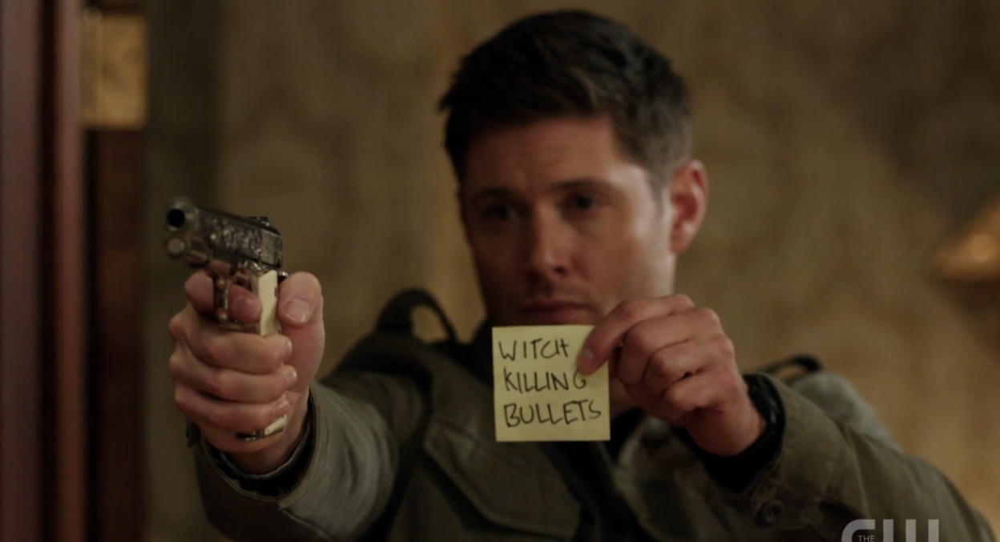

In [23]:
path="/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/DeanWinchester.png"
img= tf.keras.preprocessing.image.load_img(path)
img

In [24]:
who_is_it(path, database, FRmodel)

Not in the database.


(0.71191144, 'dean')

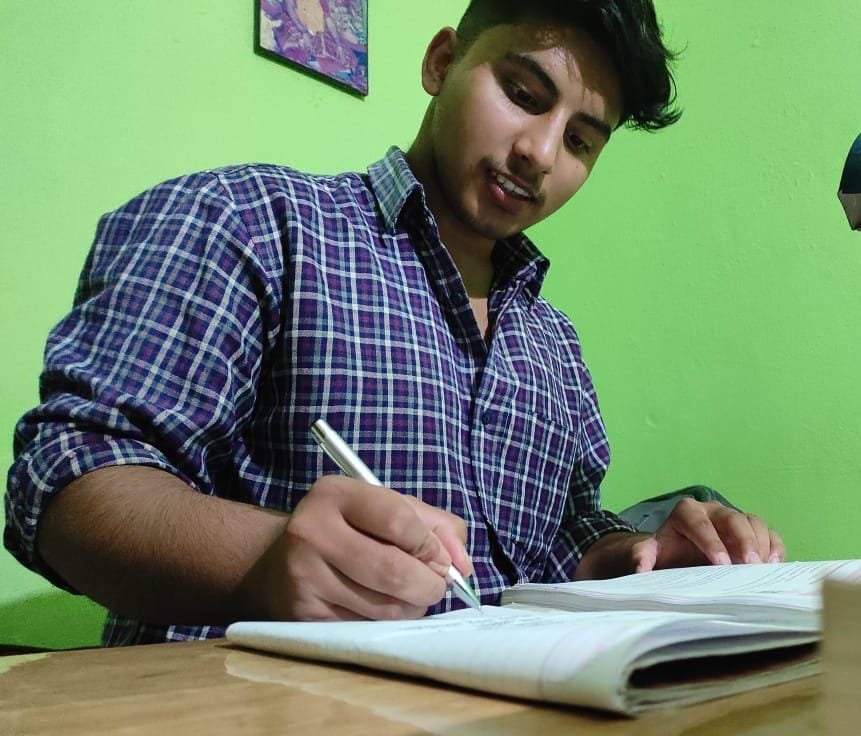

In [25]:
path="/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/lucky02.jpg"
img= tf.keras.preprocessing.image.load_img(path)
img

In [26]:
who_is_it(path, database, FRmodel)


it's deepankar, the distance is 0.54989886


(0.54989886, 'deepankar')

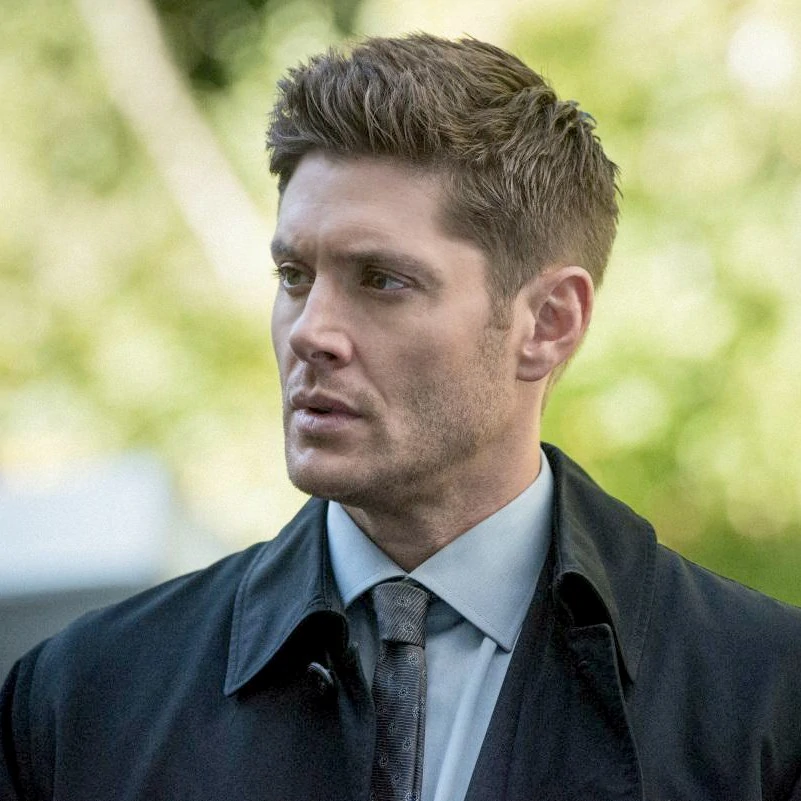

In [27]:
path="/content/drive/MyDrive/Colab Notebooks/CNN/FaceRecognition/images/dean03.jpg"
img= tf.keras.preprocessing.image.load_img(path)
img

In [28]:
who_is_it(path, database, FRmodel)


it's dean, the distance is 0.5995603


(0.5995603, 'dean')